In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob

In [2]:
img = [cv2.imread(file, cv2.IMREAD_GRAYSCALE) for file in glob.glob('E:/IP1/**/*.ppm',recursive=True)]

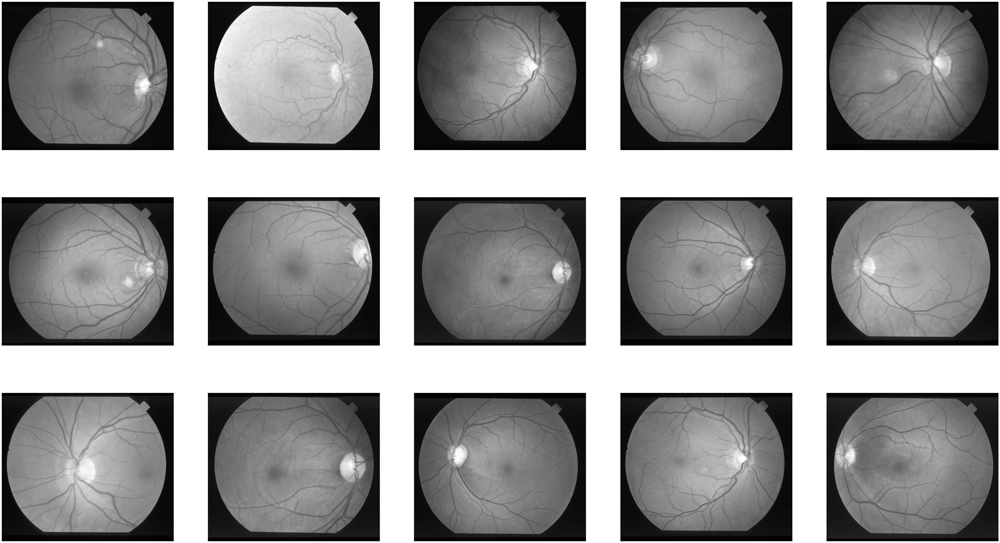

In [3]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img[i], cmap='gray')
    plt.axis('off')

***Sharpening the blood vessels using $9\times9$ Laplacian Kernel***

In [4]:
laplacian = []
for i in range(len(img)):
    laplacian.append(cv2.Laplacian(img[i],cv2.CV_16S, ksize=9))

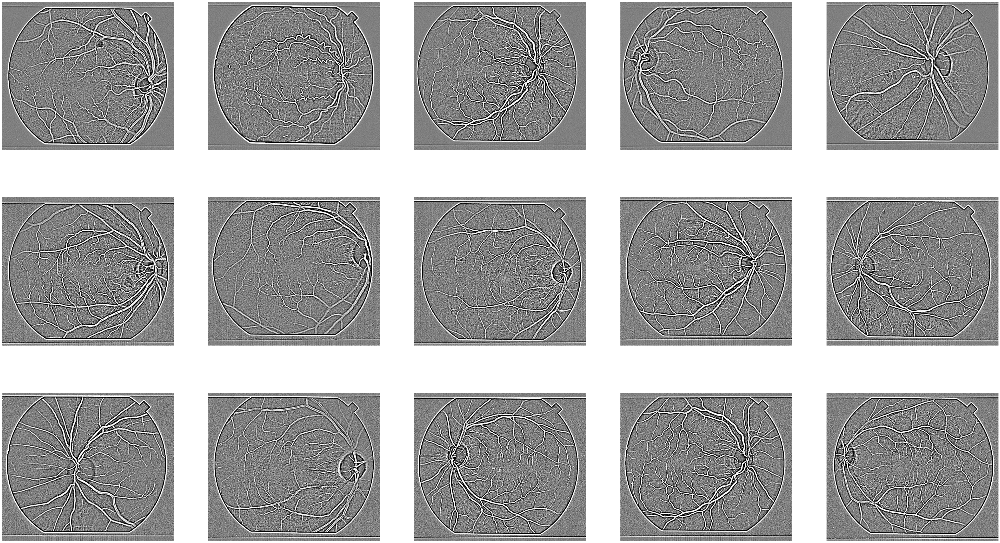

In [5]:
fig2 = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(laplacian)):
    fig2.add_subplot(rows, columns, i+1)
    plt.imshow(laplacian[i], cmap='gray')
    plt.axis('off')

***Normalization of the sharpen images***

In [6]:
ln = []
for i in range(len(laplacian)):
    ln.append(cv2.normalize(laplacian[i],None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F))

***Binary masking for the blood vessels using threshold 0.75 on normalize image***

In [7]:
Thr = []
for i in range(len(ln)):
    arr_thres = np.zeros(ln[i].shape)
    arr_thres = ((ln[i] > .75).astype(np.uint8))*255
    Thr.append(arr_thres)

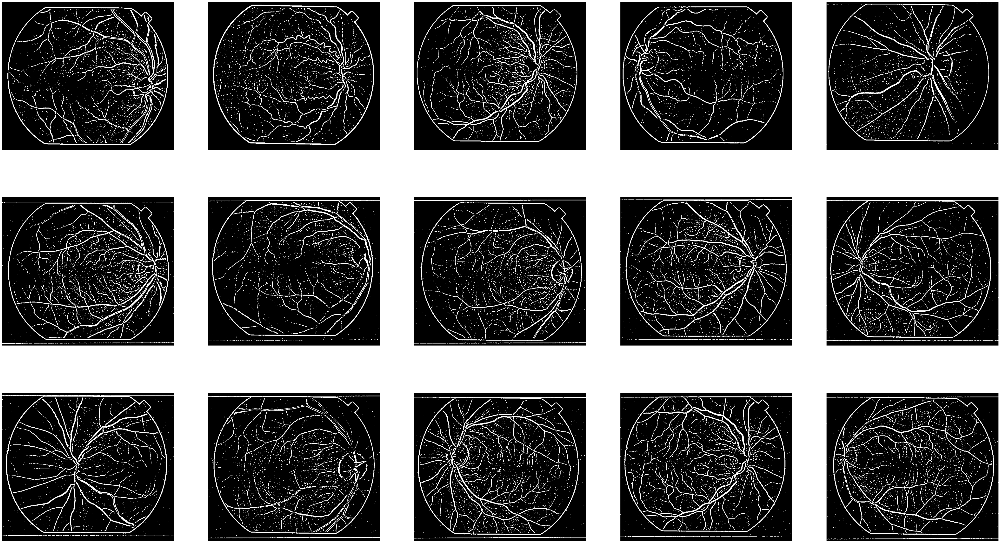

In [8]:
fig3 = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(Thr)):
    fig3.add_subplot(rows, columns, i+1)
    plt.imshow(Thr[i], cmap='gray')
    plt.axis('off')